In [4]:
import numpy as np
import pandas as pd
import datetime 
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point, Polygon
from datetime import timedelta
import os
import pickle
import tqdm 

In [5]:
import numpy as np

def create_grid(width, depth):
    # Define the range of latitudes and longitudes
    min_lat, max_lat = -90, 90
    min_lon, max_lon = -180, 180
    
    # Calculate the number of grid cells in each dimension
    num_lat_cells = int((max_lat - min_lat) / depth)
    num_lon_cells = int((max_lon - min_lon) / width)
    # print(num_lon_cells)
    # Create an empty grid to store the IDs
    grid = np.empty((num_lat_cells, num_lon_cells), dtype=object)
    
    # Assign IDs to each grid cell
    for lon_idx in range(num_lon_cells):
        for lat_idx in range(num_lat_cells):
            lat_start = min_lat + lat_idx * depth
            lat_end = lat_start + depth
            lon_start = min_lon + lon_idx * width
            lon_end = lon_start + width
            grid[lat_idx, lon_idx] = f'G{lat_idx * num_lon_cells + lon_idx + 1}: (({lon_start},{lon_end}),({lat_start},{lat_end}))'
    
    return grid

# Example usage
grid = create_grid(20, 20)
# print(grid)


In [18]:
data = pd.read_pickle('C:\\PROJECT-DEMETER\\VAE-Image\\Up_Orbits-max-val-location.pkl')

In [19]:
specific_key = 'G114'
all_band_values = {}

# Iterate over each grid
for grid_data in data[specific_key]:
    # Iterate over each item (fb_1, fb_2, etc.) in the grid_data
    for band_key, band_data in grid_data.items():
        # Check if the current item is one of the bands (fb_1, fb_2, ..., fb_n)
        if band_key.startswith('fb_'):
            # Add the band data to the corresponding list in all_band_values
            if band_key in all_band_values:
                all_band_values[band_key].append(band_data)
            else:
                all_band_values[band_key] = [band_data]

# Print the dictionary containing data for each band separately
for band_key, band_values in all_band_values.items():
    print(f"{band_key} values:")
    for data_point in band_values:
        print(data_point)
    print()

fb_1 values:
{'datetime': Timestamp('2005-01-01 03:01:50.890000'), 'max': 0.3874683678150177, 'Q1': -0.8282179236412048, 'Q2': -0.6517473459243774, 'Q3': -0.40664929151535034, 'lat': 30.9404, 'lon': -76.8383}
{'datetime': Timestamp('2005-01-01 03:03:53.770000'), 'max': 0.3090369999408722, 'Q1': -0.7105708718299866, 'Q2': -0.5537081360816956, 'Q3': -0.39684537053108215, 'lat': 38.3076, 'lon': -78.94139999999999}
{'datetime': Timestamp('2005-01-02 02:08:17.612000'), 'max': 1.328644871711731, 'Q1': -0.504688523709774, 'Q2': -0.23998261988162994, 'Q3': 0.19138993322849274, 'lat': 31.8802, 'lon': -63.63780000000003}
{'datetime': Timestamp('2005-01-02 02:10:20.492000'), 'max': 1.9953114986419678, 'Q1': 0.03452718257904053, 'Q2': 0.5443311333656311, 'Q3': 0.9364879727363586, 'lat': 39.2457, 'lon': -65.77890000000002}
{'datetime': Timestamp('2005-01-02 02:12:23.372000'), 'max': 3.4855074882507324, 'Q1': 0.9462918937206268, 'Q2': 1.6031546592712402, 'Q3': 2.1815860867500305, 'lat': 46.5853, 'lo

In [20]:
fb_1_values = []
specific_key = 'G114'
# Iterate over each grid
for grid_data in data[specific_key]:
    # Iterate over each item (fb_1, fb_2, etc.) in the grid_data
    for band_key, band_data in grid_data.items():
        # Check if the current item is fb_1
        if band_key == 'fb_1':
            # Add the fb_1 data to the fb_1_values dictionary
            fb_1_values.append(band_data)

# Print the merged dictionary containing all fb_1 values
print(fb_1_values)

[{'datetime': Timestamp('2005-01-01 03:01:50.890000'), 'max': 0.3874683678150177, 'Q1': -0.8282179236412048, 'Q2': -0.6517473459243774, 'Q3': -0.40664929151535034, 'lat': 30.9404, 'lon': -76.8383}, {'datetime': Timestamp('2005-01-01 03:03:53.770000'), 'max': 0.3090369999408722, 'Q1': -0.7105708718299866, 'Q2': -0.5537081360816956, 'Q3': -0.39684537053108215, 'lat': 38.3076, 'lon': -78.94139999999999}, {'datetime': Timestamp('2005-01-02 02:08:17.612000'), 'max': 1.328644871711731, 'Q1': -0.504688523709774, 'Q2': -0.23998261988162994, 'Q3': 0.19138993322849274, 'lat': 31.8802, 'lon': -63.63780000000003}, {'datetime': Timestamp('2005-01-02 02:10:20.492000'), 'max': 1.9953114986419678, 'Q1': 0.03452718257904053, 'Q2': 0.5443311333656311, 'Q3': 0.9364879727363586, 'lat': 39.2457, 'lon': -65.77890000000002}, {'datetime': Timestamp('2005-01-02 02:12:23.372000'), 'max': 3.4855074882507324, 'Q1': 0.9462918937206268, 'Q2': 1.6031546592712402, 'Q3': 2.1815860867500305, 'lat': 46.5853, 'lon': -68.

In [22]:
datetime_values = [entry['datetime'] for entry in fb_1_values]
q1_values = [entry['Q1'] for entry in fb_1_values]

# Print the extracted values
print("Datetime values:", len(datetime_values))
print("Q1 values:", len(q1_values))

Datetime values: 4606
Q1 values: 4606


In [23]:
base_directory = "C:/PROJECT-DEMETER/GRID-FB-UP_ICE"
    
for band_key, band_values in all_band_values.items():

    datetime_values = [entry['datetime'] for entry in band_values]
    q1_values = [entry['Q1'] for entry in band_values]
    q2_values = [entry['Q2'] for entry in band_values]
    q3_values = [entry['Q3'] for entry in band_values]
    
    # Create a new figure and axis for each band
    fig, ax = plt.subplots(figsize=(22, 7), nrows=3, ncols=1, sharex=True)
    
    # Plot the datetime and Q1 values for the current band
    ax[0].scatter(datetime_values, q1_values, s = 6)
    ax[1].scatter(datetime_values, q2_values,color = 'green', s= 6)
    ax[2].scatter(datetime_values, q3_values ,color = 'orange',s =6)
    
    # Set y-axis limits to -3 to 3
    for ax_ in ax:
        ax_.set_ylim(-3, 4)
        ax_.grid(True)
        ax_.set_yticks(np.linspace(-3, 4, 6))
    
    # Set labels, title, and rotate x-axis labels
    fig.suptitle(f'Variation of Q1, Q2, Q3 with Time for Band: {band_key}')
    ax[-1].set_xlabel('Time')
    ax[0].set_ylabel('Q1')
    ax[1].set_ylabel('Q2')
    ax[2].set_ylabel('Q3')
    ax[-1].tick_params(axis='x', rotation=45)
    fig.text(0.0, 0.5, 'log(μV^2 m^-2 Hz^-1)', va='center', rotation='vertical', fontsize=10)
    band_directory = os.path.join(base_directory, band_key)
    os.makedirs(band_directory, exist_ok=True)
    plt.tight_layout()
    # # Save the figure in the band directory
    # image_path = os.path.join(band_directory, f"{specific_key}-{band_key}.png")
    # plt.savefig(image_path)
    # plt.close()  
    
    plt.show()

KeyboardInterrupt: 

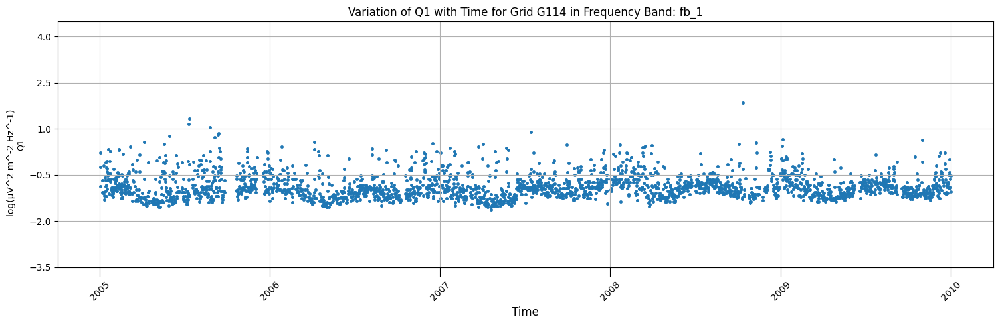

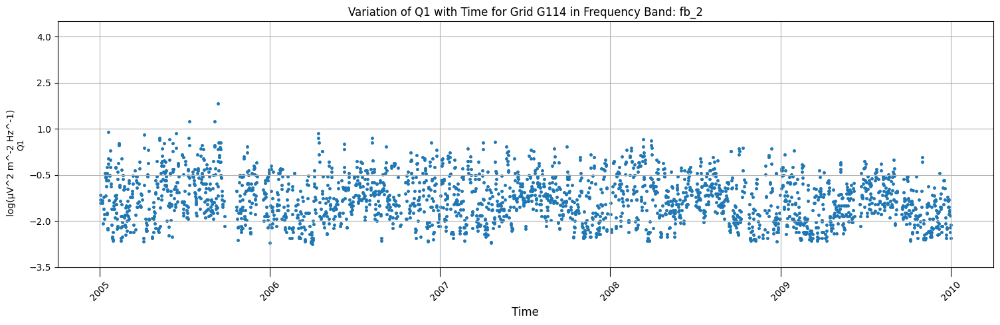

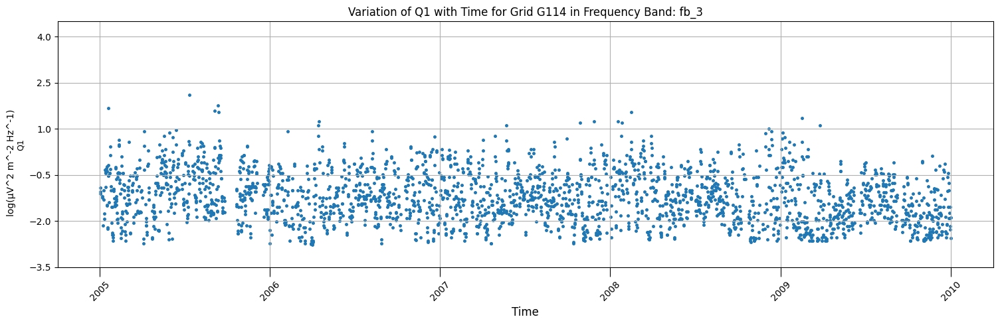

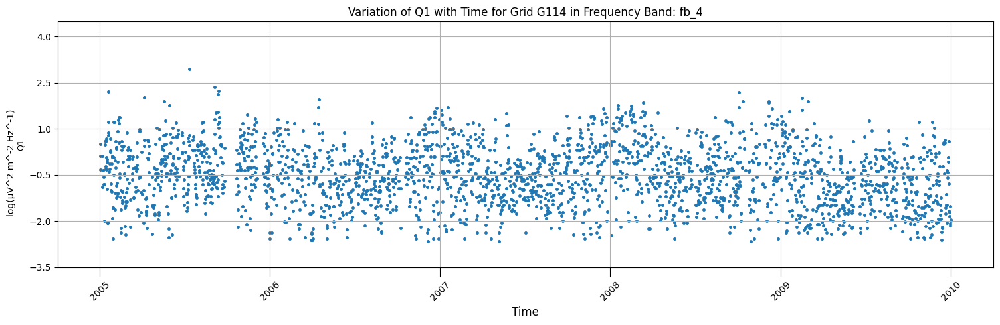

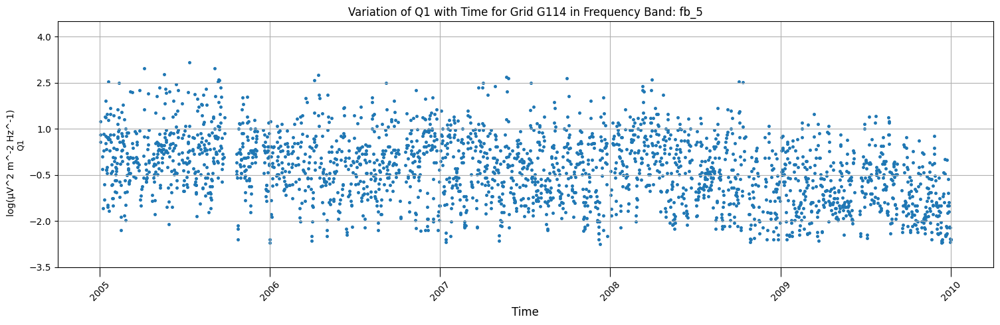

...

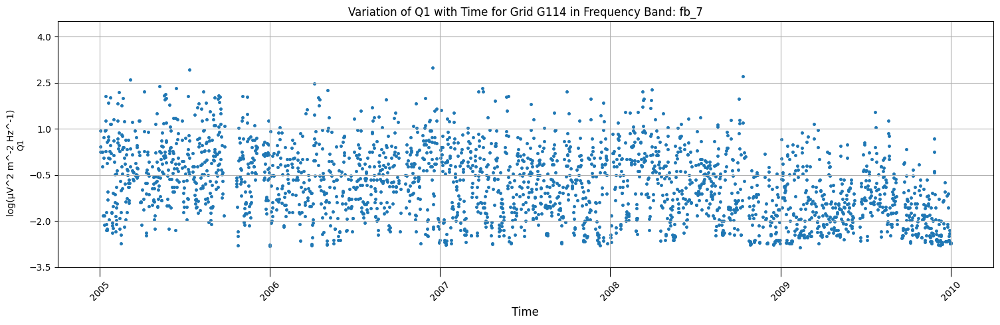

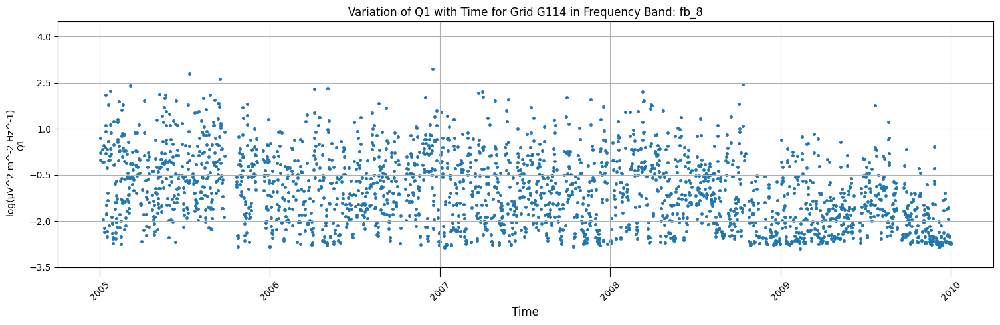

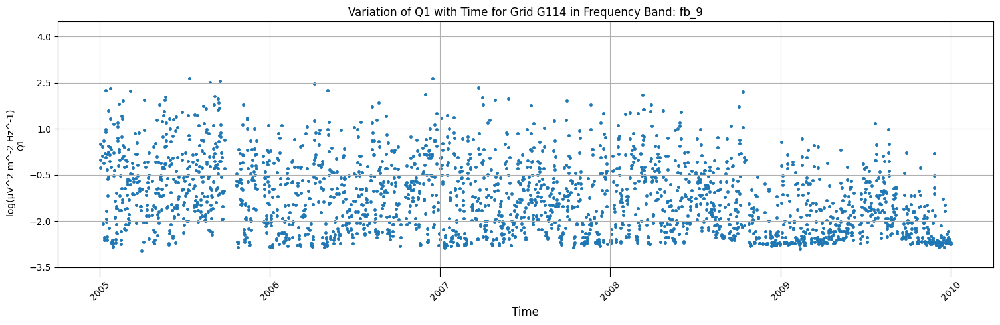

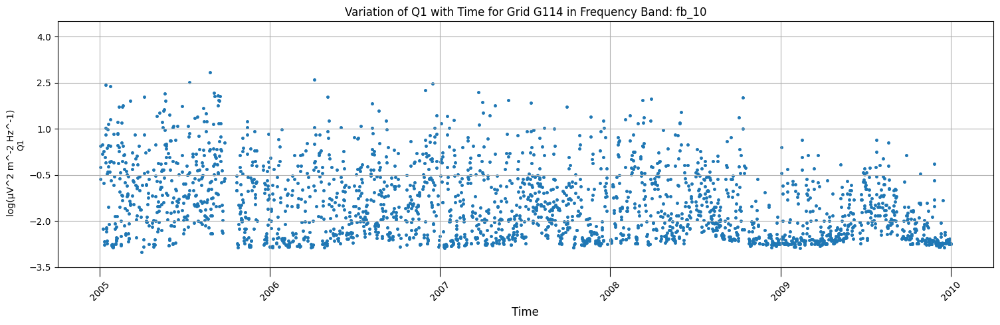

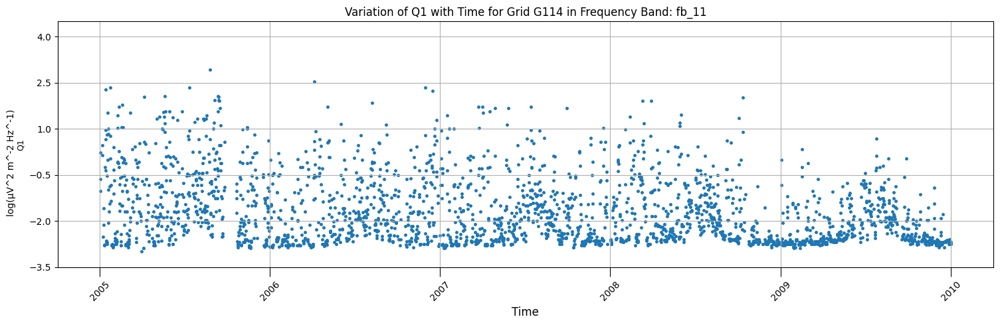

In [12]:
for band_key, band_values in all_band_values.items():

    datetime_values = [entry['datetime'] for entry in band_values]
    q1_values = [entry['Q1'] for entry in band_values]

    # Create a new figure and axis
    fig, ax = plt.subplots(figsize=(15, 5))

    # Plot the datetime and Q1 values for the current band
    ax.scatter(datetime_values, q1_values, s=6.5)

    # Set y-axis limits to -3 to 3
    ax.set_ylim(-3.5, 4.5)
    ax.grid(True)
    ax.set_yticks(np.linspace(-3.5, 4, 6))

    # Set labels, title, and rotate x-axis labels
    ax.set_title(f'Variation of Q1 with Time for Grid {specific_key} in Frequency Band: {band_key}', fontsize=12)
    ax.set_xlabel('Time', fontsize=12)
    ax.set_ylabel('Q1', fontsize=9)
    ax.tick_params(axis='x', rotation=45, size=10)
    
    fig.text(0.0, 0.5, 'log(μV^2 m^-2 Hz^-1)', va='center', rotation='vertical', fontsize=10) 
    plt.tight_layout()
    # Save the figure in the base directory
    plt.savefig(f'{specific_key}-{band_key}.png', dpi=300)
    plt.show()
    plt.close()


In [15]:

all_keys = list(data.keys())

# Filter keys to include only those from G19 to G144
filtered_keys = [key for key in all_keys if key.startswith('G') and 19 <= int(key[1:]) <= 144]

# Sort the filtered keys in ascending order
sorted_keys = sorted(filtered_keys, key=lambda x: int(x[1:]))

# Now sorted_keys contains the grids from G19 to G144 in ascending order
print(sorted_keys)


['G19', 'G20', 'G21', 'G22', 'G23', 'G24', 'G25', 'G26', 'G27', 'G28', 'G29', 'G30', 'G31', 'G32', 'G33', 'G34', 'G35', 'G36', 'G37', 'G38', 'G39', 'G40', 'G41', 'G42', 'G43', 'G44', 'G45', 'G46', 'G47', 'G48', 'G49', 'G50', 'G51', 'G52', 'G53', 'G54', 'G55', 'G56', 'G57', 'G58', 'G59', 'G60', 'G61', 'G62', 'G63', 'G64', 'G65', 'G66', 'G67', 'G68', 'G69', 'G70', 'G71', 'G72', 'G73', 'G74', 'G75', 'G76', 'G77', 'G78', 'G79', 'G80', 'G81', 'G82', 'G83', 'G84', 'G85', 'G86', 'G87', 'G88', 'G89', 'G90', 'G91', 'G92', 'G93', 'G94', 'G95', 'G96', 'G97', 'G98', 'G99', 'G100', 'G101', 'G102', 'G103', 'G104', 'G105', 'G106', 'G107', 'G108', 'G109', 'G110', 'G111', 'G112', 'G113', 'G114', 'G115', 'G116', 'G117', 'G118', 'G119', 'G120', 'G121', 'G122', 'G123', 'G124', 'G125', 'G126', 'G127', 'G128', 'G129', 'G130', 'G131', 'G132', 'G133', 'G134', 'G135', 'G136', 'G137', 'G138', 'G139', 'G140', 'G141', 'G142', 'G143', 'G144']


In [ ]:

for specific_key in sorted_keys:
    all_band_values = {}

    # Iterate over each grid for the current specific key
    for grid_data in data[specific_key]:
        # Iterate over each item (fb_1, fb_2, etc.) in the grid_data
        for band_key, band_data in grid_data.items():
            # Check if the current item is one of the bands (fb_1, fb_2, ..., fb_n)
            if band_key.startswith('fb_'):
                # Add the band data to the corresponding list in all_band_values
                if band_key in all_band_values:
                    all_band_values[band_key].append(band_data)
                else:
                    all_band_values[band_key] = [band_data]

    # Iterate over each band and its corresponding values
    for band_key, band_values in all_band_values.items():

        datetime_values = [entry['datetime'] for entry in band_values]
        q1_values = [entry['Q1'] for entry in band_values]
        q2_values = [entry['Q2'] for entry in band_values]
        q3_values = [entry['Q3'] for entry in band_values]
        max_values = [entry['max'] for entry in band_values]
        # Create a new figure and axis for each band
        fig, ax = plt.subplots(figsize=(20, 8), nrows=4, ncols=1, sharex=True)

        # Plot the datetime and Q1 values for the current band
        ax[0].scatter(datetime_values, q1_values, s=6.5)
        ax[1].scatter(datetime_values, q2_values, color='green', s=6.5)
        ax[2].scatter(datetime_values, q3_values, color='orange', s=6.5)
        ax[3].scatter(datetime_values, max_values, color='orange', s=6.5)

        # Set y-axis limits to -3 to 3
        for ax_ in ax:
            ax_.set_ylim(-3.5, 4.5)
            ax_.grid(True)
            ax_.set_yticks(np.linspace(-3.5, 4, 6))

        # Set labels, title, and rotate x-axis labels
        fig.suptitle(f'Variation of Q1, Q2, Q3 & max with Time for Grid {specific_key} in Frequency Band: {band_key}',fontsize=18)
        ax[-1].set_xlabel('Time',fontsize=15)
        ax[0].set_ylabel('Q1 ',fontsize=12)
        ax[1].set_ylabel('Q2 ',fontsize=12)
        ax[2].set_ylabel('Q3 ',fontsize=12)
        ax[3].set_ylabel('Max',fontsize=12)
        ax[-1].tick_params(axis='x', rotation=45,size=12)
        
        fig.text(0.06, 0.5, 'log(μV^2 m^-2 Hz^-1)', va='center', rotation='vertical', fontsize=15) 

        # Create the directory if it doesn't exist
        # band_directory = os.path.join(base_directory, band_key)
        # os.makedirs(band_directory, exist_ok=True)
        plt.tight_layout()
        # Save the figure in the band directory
        # image_path = os.path.join(band_directory, f"{specific_key}-{band_key}.png")
        # plt.savefig(f'{specific_key}-{band_key}.png',dpi=300)
        # plt.close()

        plt.show()
